## Visão Geral
Neste case técnico, você deverá desenvolver uma solução baseada em dados para
direcionar uma estratégia de cupons como alavanca de crescimento. O desafio
permitirá que você demonstre suas habilidades em modelagem, estatística e análi-
se de dados, assim como senso crítico e comunicação de resultados.
Leia o case por completo antes de começar a desenvolver sua solução.
## Contexto
Você foi contratado como Analista de Dados no iFood, uma das maiores empresas
de tecnologia da América Latina. Seu primeiro projeto envolve analisar os resulta-
dos de um teste A/B realizado recentemente, desenhado para avaliar o impacto
de uma estratégia de cupons na retenção de usuários.
Lembre-se de preparar os dados antes da análise utilizando boas práticas do
processo de ETL.



## O Desafio
1. No iFood, várias áreas utilizam testes A/B para avaliar o impacto de
ações em diferentes métricas. Esses testes permitem validar hipóteses
de crescimento e a viabilidade de novas funcionalidades em um grupo
restrito de usuários. Nos dados fornecidos nesse case você encontrará
uma marcação de usuários, separando os entre grupo teste e controle
de uma campanha de cupons, que disponibilizou para os usuários do
grupo teste um cupom especial.
- a) Defina os indicadores relevantes para mensurar o sucesso da
campanha e analise se ela teve impacto significativo dentro do
período avaliado.
- b) Faça uma análise de viabilidade financeira dessa iniciativa
como alavanca de crescimento, adotando as premissas que julgar necessárias (explicite as premissas adotadas).
- c) Recomende oportunidades de melhoria nessa ação e desenhe uma nova proposta de teste A/B para validar essas hipóteses.
2
2. A criação de segmentações permite agrupar usuários de acordo com
características e comportamentos similares, possibilitando criar estraté-
gias direcionadas de acordo com o perfil de cada público, facilitando a
personalização e incentivando o engajamento, retenção, além de otimização de recursos. Segmentações de usuários são muito utilizadas pelos times
de Data, mas a área em que você atua ainda não tem segmentos bem definidos e cada área de Negócio utiliza conceitos diferentes. Por isso, você precisa:
- a) Definir as segmentações que fazem sentido especificamente
para o teste A/B que está analisando.
- b) Estabelecer quais serão os critérios utilizados para cada segmento sugerido no item a). Utilize os critérios/ferramentas que
achar necessários, mas lembre-se de explicar o racional utiliza-
do na criação.
- c) Analisar os resultados do teste A/B com base nos segmentos
definidos nos itens a) e b).
3. Com base na análise que realizou nas questões 1 e 2, sugira os próximos passos que o iFood deve tomar. Lembre-se que você precisa defender suas sugestões para as lideranças de Negócio, por isso não es-
queça de incluir uma previsão de impacto (financeiro ou não) caso o
iFood siga com a sua recomendação. Fique à vontade para sugerir melhorias no processo/teste e para propor diferentes estratégias de acordo com cada segmento de usuário.

## Importando as Bibliotecas

In [0]:
! pip install findspark

You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-5a85e96e-828e-43cd-b2bb-b83a5c39c54e/bin/python -m pip install --upgrade pip' command.


In [0]:
import findspark
findspark.init()
from pyspark import SparkConf
from pyspark.sql import SparkSession
from pyspark.sql import functions as f
from pyspark.sql import Row, DataFrame
from pyspark.sql.types import StringType, StructType, StructField, IntegerType
from pyspark.sql.functions import col, expr, lit, substring, concat, concat_ws, when, coalesce,sum,to_date, upper, countDistinct, avg,count,first
from functools import reduce
import pandas as pd
import numpy as np
import os
from datetime import datetime, timedelta
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import urllib.request
import pyspark.pandas as ps
warnings.filterwarnings('ignore')
import requests
import tarfile
from io import BytesIO


## Usuários (consumers.csv)

Contém dados de cerca de 806k usuários do iFood. Cada usuário possui um
customer_id e os seguintes atributos complementares:

- customer_id (string): Identificador do usuário
- language (string): Idioma do usuário
- created_at (timestamp): Data e hora em que o usuário foi criado
- active (bool): Flag indicando se o usuário está ativo ou não
- customer
name (string): Primeiro nome do usuário
- customer_phone_area (string): Código de área do telefone do usuário
- customer_phone
number (string): Número do telefone do usuário

In [0]:
# URL do dataset
url = "https://data-architect-test-source.s3-sa-east-1.amazonaws.com/consumer.csv.gz"
path = "/tmp/consumer.csv.gz"

# Download
urllib.request.urlretrieve(url, path)

# Copia para o DBFS
dbutils.fs.cp("file:/tmp/consumer.csv.gz", "dbfs:/tmp/consumer.csv.gz")

df_cadastral = spark.read \
    .option("header", True) \
    .option("inferSchema", True) \
    .csv("dbfs:/tmp/consumer.csv.gz")


display(df_cadastral)

customer_id,language,created_at,active,customer_name,customer_phone_area,customer_phone_number
e8cc60860e09c0bb19610b06ced69c973eb83982cfc98e397ce65cba92f70928,pt-br,2018-04-05T14:49:18.165+0000,true,NUNO,46,816135924
a2834a38a9876cf74e016524dd2e8c1f010ee12b2b684d58c40ab11eef19b6eb,pt-br,2018-01-14T21:40:02.141+0000,true,ADRIELLY,59,231330577
41e1051728eba13341136d67d0757f8d8cc44b2a405b718a8c5efba2c093b2c0,pt-br,2018-01-07T03:47:15.554+0000,true,PAULA,62,347597883
8e7c1dcb64edf95c935147f6d560cb068c44714cb1b21b287f1f433ae7b0b04e,pt-br,2018-01-10T22:17:08.160+0000,true,HELTON,13,719366842
7823d4cf4150c5daeae0bd799206852fc123bdef0cf5d1639c8cb568d73e8c83,pt-br,2018-04-06T00:16:20.935+0000,true,WENDER,76,543232158
77e6a36569f6c8f357a661ef59b7854c1701e538ceb5a3a7821dd44797944e0c,pt-br,2018-01-27T20:00:11.176+0000,true,MICHELLE,90,806008944
0ce03c2b567f34f421372f0a8b70c6bfd04308d134d52b4436682b304f6d7dd8,pt-br,2018-01-04T14:12:16.843+0000,true,MARLOS,18,724199206
7c2c4d1fe3ce743583c15365efb8ee4ab90d92b5768ffa18b6bc659f3f86c953,pt-br,2018-03-18T20:57:06.301+0000,true,REBECCA,32,454530554
d5de3aa126ae18fd98c65fd544548cc926b36caeb8309a213631d86901bd6074,pt-br,2018-01-08T22:19:15.852+0000,true,KELLY,72,47158438
fc3b69d0454f1ec8c1d196f0d4e9a7cc1409dbc87339a89c0725ec9c054a4765,pt-br,2018-01-04T02:01:17.478+0000,true,ANA,91,533597575


In [0]:
## Olhando o Total da base
df_cadastral.count()

Out[4]: 806156

In [0]:
## Olhando os Tipo dos dados,
df_cadastral.printSchema()

root
 |-- customer_id: string (nullable = true)
 |-- language: string (nullable = true)
 |-- created_at: timestamp (nullable = true)
 |-- active: boolean (nullable = true)
 |-- customer_name: string (nullable = true)
 |-- customer_phone_area: integer (nullable = true)
 |-- customer_phone_number: integer (nullable = true)



In [0]:
# Conta nulos por coluna
df_nulls = df_cadastral.select([
    sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
    for c in df_cadastral.columns
])

# Converte para pandas e transpoe pra ficar visual
import pandas as pd
df_nulls_pd = df_nulls.toPandas().T.reset_index()
df_nulls_pd.columns = ['coluna', 'valores_nulos']
display(df_nulls_pd)

coluna,valores_nulos
customer_id,0
language,0
created_at,0
active,0
customer_name,0
customer_phone_area,0
customer_phone_number,0


In [0]:
## verificando se há linhas duplicadas
df_cadastral.distinct().count()

Out[7]: 806156

In [0]:
## Transformacao da data e hora para data para tratamento
df_cadastral = df_cadastral.withColumn("created_at", to_date("created_at"))

## Aqui é mais para padronizar os dados, tem nome que estava com maiusculo e outros minisculo, padronizacao no Nome.
df_cadastral = df_cadastral.withColumn("customer_name", upper("customer_name"))

In [0]:
df_cadastral.show(5)

+--------------------+--------+----------+------+-------------+-------------------+---------------------+
|         customer_id|language|created_at|active|customer_name|customer_phone_area|customer_phone_number|
+--------------------+--------+----------+------+-------------+-------------------+---------------------+
|e8cc60860e09c0bb1...|   pt-br|2018-04-05|  true|         NUNO|                 46|            816135924|
|a2834a38a9876cf74...|   pt-br|2018-01-14|  true|     ADRIELLY|                 59|            231330577|
|41e1051728eba1334...|   pt-br|2018-01-07|  true|        PAULA|                 62|            347597883|
|8e7c1dcb64edf95c9...|   pt-br|2018-01-10|  true|       HELTON|                 13|            719366842|
|7823d4cf4150c5dae...|   pt-br|2018-04-06|  true|       WENDER|                 76|            543232158|
+--------------------+--------+----------+------+-------------+-------------------+---------------------+
only showing top 5 rows



In [0]:

df_cadastral.select("customer_name").distinct().count()

Out[10]: 42696

In [0]:
df_cadastral.select("customer_name").distinct().count()

Out[11]: 42696

In [0]:
# Conta nulos por coluna
df_nulls = df_cadastral.select([
    sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
    for c in df_cadastral.columns
])

# Converte para pandas e transpoe pra ficar visual
import pandas as pd
df_nulls_pd = df_nulls.toPandas().T.reset_index()
df_nulls_pd.columns = ['coluna', 'valores_nulos']
display(df_nulls_pd)

coluna,valores_nulos
customer_id,0
language,0
created_at,0
active,0
customer_name,0
customer_phone_area,0
customer_phone_number,0


In [0]:
df_cadastral.filter(col("customer_id") == "e8cc60860e09c0bb19610b06ced69c973eb83982cfc98e397ce65cba92f70928").show()

+--------------------+--------+----------+------+-------------+-------------------+---------------------+
|         customer_id|language|created_at|active|customer_name|customer_phone_area|customer_phone_number|
+--------------------+--------+----------+------+-------------+-------------------+---------------------+
|e8cc60860e09c0bb1...|   pt-br|2018-04-05|  true|         NUNO|                 46|            816135924|
+--------------------+--------+----------+------+-------------+-------------------+---------------------+



In [0]:
## Aqui apenas uma verificacao para vermos se um ID tem mais de um Nome.

df_cadastral.groupBy("customer_id") \
  .agg(countDistinct("customer_name").alias("qtd_ids")) \
  .filter(col("qtd_ids") > 1) \
  .orderBy("qtd_ids", ascending=False) \
  .show()

+-----------+-------+
|customer_id|qtd_ids|
+-----------+-------+
+-----------+-------+



### Checagem rápida de dados.

Nesta etapa, realizamos uma verificação inicial do DataFrame, incluindo a contagem total de linhas, identificação de duplicidades e algumas transformações pontuais. Essas ações são importantes para garantir a qualidade dos dados e preparar a base para os joins e análises posteriores.

In [0]:
df_cadastral.createOrReplaceTempView("cadastral")

## Merchants (restaurant.csv)

Contém dados de cerca de 7k restaurantes do iFood. Cada restaurante possui
um id e os seguintes atributos complementares:

- id (string): Identificador do restaurante
- created_at (timestamp): Data e hora em que o restaurante foi criado
- enabled (bool): Flag indicando se o restaurante está ativo no iFood ou
não
- price
range (int): Classificação de preço do restaurante
- average
ticket (float): Ticket médio dos pedidos no restaurante
- delivery
time (float): Tempo padrão de entrega para pedidos no restaurante
- minimum_order
value (float): Valor mínimo para pedidos no restaurante
- merchant_zip_
code (string): CEP do restaurante
- merchant
city (string): Cidade do restaurante
- merchant_state (string): Estado do restaurante
- merchant
country (string): País do restaurante

In [0]:
# URL do dataset
url = "https://data-architect-test-source.s3-sa-east-1.amazonaws.com/restaurant.csv.gz"
path = "/tmp/restaurant.csv.gz"

# Download
urllib.request.urlretrieve(url, path)

# Copia para o DBFS
dbutils.fs.cp("file:/tmp/restaurant.csv.gz", "dbfs:/tmp/restaurant.csv.gz")

restaurante = spark.read \
    .option("header", True) \
    .option("inferSchema", True) \
    .csv("dbfs:/tmp/restaurant.csv.gz")


display(restaurante)

id,created_at,enabled,price_range,average_ticket,takeout_time,delivery_time,minimum_order_value,merchant_zip_code,merchant_city,merchant_state,merchant_country
d19ff6fca6288939bff073ad0a119d25c0365c407e9e5dd999e7a3e53c6d5d76,2017-01-23T12:52:30.910+0000,false,3,60.0,0,50,30.0,14025,RIBEIRAO PRETO,SP,BR
631df0985fdbbaf27b9b031a8f381924e3483833385748c8f7e1a41a6891d2b9,2017-01-20T13:14:48.286+0000,true,3,60.0,0,0,30.0,50180,SAO PAULO,SP,BR
135c5c4ae4c1ec1fdc23e8c649f313e39be8db913d8bc5aaff9bfddb548f096d,2017-01-23T12:46:33.457+0000,true,5,100.0,0,45,10.0,23090,RIO DE JANEIRO,RJ,BR
d26f84c470451f752bef036c55517b6d9950d41806f10e94e8b5734241468768,2017-01-20T13:15:04.806+0000,true,3,80.0,0,0,18.9,40255,SALVADOR,BA,BR
97b9884600ea7192314580d9115f8882b8634f5aa201ff9a6df206e49343a283,2017-01-20T13:14:27.701+0000,true,3,60.0,0,0,25.0,64600,BARUERI,SP,BR
1ec1343b97cae3e3fc561926425f5fa9ee514f4cbcc99b8b3d0689af3b1e8197,2017-01-23T12:36:59.158+0000,false,1,30.0,0,60,10.0,18030,SOROCABA,SP,BR
a296322ddb834e65ac755cc1fa1cf1957d4f6134ef088419024a361640aa286a,2017-01-23T12:40:20.431+0000,false,1,30.0,0,70,11.0,13208,JUNDIAI,SP,BR
283f457637aa69ef68df6d8ca077349bf86219c01f918ba1ffcbcbefcf944aac,2017-01-20T13:14:31.699+0000,true,4,80.0,0,30,24.0,34020,SAO PAULO,SP,BR
d171f94340260767e67ae9a520ae9881949dba7945771d5248707bc07847f05f,2017-01-20T13:13:05.136+0000,false,5,81.0,30,15,10.0,45380,SAO PAULO,SP,BR
1b8219cc06c6b99de0cfd80d2fef350ed0494ad88ceab0e643238da12dbf2559,2017-01-20T13:15:57.202+0000,false,1,30.0,0,30,0.0,60541,FORTALEZA,CE,BR


In [0]:
## Olhando o Total da base
restaurante.count()

Out[17]: 7292

In [0]:
## Olhando os Tipo dos dados,
restaurante.printSchema()

root
 |-- id: string (nullable = true)
 |-- created_at: timestamp (nullable = true)
 |-- enabled: boolean (nullable = true)
 |-- price_range: integer (nullable = true)
 |-- average_ticket: double (nullable = true)
 |-- takeout_time: integer (nullable = true)
 |-- delivery_time: integer (nullable = true)
 |-- minimum_order_value: double (nullable = true)
 |-- merchant_zip_code: integer (nullable = true)
 |-- merchant_city: string (nullable = true)
 |-- merchant_state: string (nullable = true)
 |-- merchant_country: string (nullable = true)



In [0]:
restaurante = restaurante.select("id","enabled","price_range","average_ticket","delivery_time","minimum_order_value","merchant_zip_code")

In [0]:
## Aqui apenas uma verificacao para vermos se um ID tem mais de um Nome.

restaurante.groupBy("id") \
  .agg(countDistinct("enabled").alias("qtd_ids")) \
  .filter(col("qtd_ids") > 1) \
  .orderBy("qtd_ids", ascending=False) \
  .show()

+---+-------+
| id|qtd_ids|
+---+-------+
+---+-------+



In [0]:
# Conta nulos por coluna
df_nulls = restaurante.select([
    sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
    for c in restaurante.columns
])

# Converte para pandas e transpoe pra ficar visual
import pandas as pd
df_nulls_pd = df_nulls.toPandas().T.reset_index()
df_nulls_pd.columns = ['coluna', 'valores_nulos']
display(df_nulls_pd)

coluna,valores_nulos
id,0
enabled,0
price_range,0
average_ticket,0
delivery_time,1
minimum_order_value,95
merchant_zip_code,0


In [0]:
## Resolvi substituir os valores nulos por 0, por que sao dois campos que se tiver com zero nao impacta muito o resultado final
restaurante = restaurante.fillna({"delivery_time": 0, "minimum_order_value": 0})

### Verificação inicial dos dados:

Nesta etapa, foi realizada uma checagem preliminar do DataFrame, incluindo a contagem total de linhas, identificação de possíveis duplicidades e algumas transformações pontuais. Essas ações são essenciais para garantir a integridade dos dados e preparar a base para os joins e análises futuras.
Além disso, selecionamos apenas as colunas mais relevantes para a análise, com o objetivo de tornar o processo mais eficiente e focado.

In [0]:
restaurante.createOrReplaceTempView("restaurante")

## Marcação de usuários que participaram do teste A/B (ab_test_ref.csv)

Contém uma marcação indicando se um usuário participou do teste A/B em
questão. Assim como a base de usuários, cada usuário possui um customer_id.
Os campos são:

- customer_id (string): Identificador do usuário
- is
target (string): Grupo ao qual o usuário pertence (target oucontrol).

In [0]:
# 1. Baixa o arquivo tar.gz
url = "https://data-architect-test-source.s3-sa-east-1.amazonaws.com/ab_test_ref.tar.gz"
response = requests.get(url)
file_like_object = BytesIO(response.content)

# 2. Extrai o CSV
with tarfile.open(fileobj=file_like_object, mode="r:gz") as tar:
    for member in tar.getmembers():
        if member.name.endswith(".csv"):
            extracted_file = tar.extractfile(member)
            df_pandas = pd.read_csv(extracted_file, encoding="latin1")  # 👈 Aqui resolvemos o erro

# 3. Converte pra Spark DataFrame
df_ab = spark.createDataFrame(df_pandas)
df_ab.show(5)


+--------------------+---------+
|         customer_id|is_target|
+--------------------+---------+
|755e1fa18f25caec5...|   target|
|b821aa8372b8e5b82...|  control|
|d425d6ee4c9d4e211...|  control|
|6a7089eea0a5dc294...|   target|
|dad6b7e222bab31c0...|  control|
+--------------------+---------+
only showing top 5 rows



In [0]:
df_ab.count()

Out[25]: 806467

In [0]:
# Conta nulos por coluna
df_nulls = df_ab.select([
    sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
    for c in df_ab.columns
])

# Converte para pandas e transpoe pra ficar visual
import pandas as pd
df_nulls_pd = df_nulls.toPandas().T.reset_index()
df_nulls_pd.columns = ['coluna', 'valores_nulos']
display(df_nulls_pd)

coluna,valores_nulos
customer_id,1
is_target,0


In [0]:
## precisei remover isso, por que se nao tiver o id, nao conseguimos cruzar com as outras tabelas
df_ab = df_ab.na.drop(subset=["customer_id"])

In [0]:
df_ab.createOrReplaceTempView("teste_ab")

## Base Pedidos (order.json)

Esta base apresenta todos os pedidos feitos pelos clientes, incluindo informações detalhadas sobre cada transação.

- cpf (string): Cadastro de Pessoa Física do usuário que realizou o pedido.
- customer_id (string): Identificador do usuário.
- customer
name (string): Primeiro nome do usuário.
- delivery_address_city (string): Cidade de entrega do pedido.
- delivery_address
country (string): País da entrega.
- delivery_address_district (string): Bairro da entrega.
- delivery_address_external_id (string): Identificador do endereço
de entrega.
- delivery_address
latitude (float): Latitude do endereço de entrega.
- delivery_address
longitude (float): Longitude do endereço de entrega.
- delivery_address_state (string): Estado da entrega.
- delivery_address_zip_
code (string): CEP da entrega.
- items (array[json]): Itens que compõem o pedido, bem como informa-
ções complementares como preço unitário, quantidade, etc.
- merchant_id (string): Identificador do restaurante.
- merchant_latitude (float): Latitude do restaurante.
- merchant
longitude (float): Longitude do restaurante.
- merchant
timezone (string): Fuso horário em que o restaurante está localizado.
- order
_
created_at (timestamp): Data e hora em que o pedido foi criado.
- order_id (string): Identificador do pedido.
- order_scheduled (bool): Flag indicando se pedido foi agendado ou
não (pedidos agendados são aqueles que o usuário escolheu uma data
e hora para a entrega)
- order
_
total_amount (float): Valor total do pedido em Reais.
- origin
platform (string): Sistema operacional do dispositivo do
usuário.
- order_scheduled
date (timestamp): Data e horário para entrega do
pedido agendado.


In [0]:
# Baixa o arquivo para o sistema de arquivos local
url = "https://data-architect-test-source.s3-sa-east-1.amazonaws.com/order.json.gz"
local_path = "/tmp/order.json.gz"  # Caminho local no driver (não DBFS)

urllib.request.urlretrieve(url, local_path)
print("Arquivo baixado com sucesso.")

# Move para o DBFS
dbutils.fs.cp("file:/tmp/order.json.gz", "dbfs:/tmp/order.json.gz")

Arquivo baixado com sucesso.
Out[29]: True

In [0]:
df_pedidos = spark.read.json("dbfs:/tmp/order.json.gz")
display(df_pedidos)

cpf,customer_id,customer_name,delivery_address_city,delivery_address_country,delivery_address_district,delivery_address_external_id,delivery_address_latitude,delivery_address_longitude,delivery_address_state,delivery_address_zip_code,items,merchant_id,merchant_latitude,merchant_longitude,merchant_timezone,order_created_at,order_id,order_scheduled,order_scheduled_date,order_total_amount,origin_platform
80532101763,7ba88a68bb2a3504c6bd37a707af57a0b8d6e110a551c719c9e7f71aaf3a99cf,GUSTAVO,FRANCA,BR,JARDIM ESPRAIADO,6736655,-47.39,-20.55,SP,14403,"[{""name"": ""Parmegiana de Filé de Frango (2 pessoas)"", ""addition"": {""value"": ""0"", ""currency"": ""BRL""}, ""discount"": {""value"": ""0"", ""currency"": ""BRL""}, ""quantity"": 1.00, ""sequence"": 1, ""unitPrice"": {""value"": ""2800"", ""currency"": ""BRL""}, ""externalId"": ""0bcd6764fd5e466d9c04b18ac0eb69e6"", ""totalValue"": {""value"": ""2800"", ""currency"": ""BRL""}, ""customerNote"": null, ""garnishItems"": [{""name"": ""COM Arroz branco"", ""addition"": {""value"": ""0"", ""currency"": ""BRL""}, ""discount"": {""value"": ""0"", ""currency"": ""BRL""}, ""quantity"": 1.00, ""sequence"": 2, ""unitPrice"": {""value"": ""0"", ""currency"": ""BRL""}, ""categoryId"": ""13HDH"", ""externalId"": ""384bd2b4eb7d454d8e0274e7d590ab4f"", ""totalValue"": {""value"": ""0"", ""currency"": ""BRL""}, ""categoryName"": ""PERSONALIZAR"", ""integrationId"": null}], ""integrationId"": ""PMFR"", ""totalAddition"": {""value"": ""0"", ""currency"": ""BRL""}, ""totalDiscount"": {""value"": ""0"", ""currency"": ""BRL""}}, {""name"": ""Lasanha Frango (2 pessoas)"", ""addition"": {""value"": ""0"", ""currency"": ""BRL""}, ""discount"": {""value"": ""0"", ""currency"": ""BRL""}, ""quantity"": 1.00, ""sequence"": 3, ""unitPrice"": {""value"": ""1800"", ""currency"": ""BRL""}, ""externalId"": ""a361f5eec6a44ac0817892e81bf22e80"", ""totalValue"": {""value"": ""1800"", ""currency"": ""BRL""}, ""customerNote"": null, ""garnishItems"": [], ""integrationId"": ""LF"", ""totalAddition"": {""value"": ""0"", ""currency"": ""BRL""}, ""totalDiscount"": {""value"": ""0"", ""currency"": ""BRL""}}]",a992a079a651e699d9149423761df2427c0e3af0a2a1b5bb6d2bad1cb3a3a265,-47.39,-20.55,America/Sao_Paulo,2019-01-17T22:50:06.000Z,33e0612d62e5eb42aba15b58413137e441fbe906de2febd6a6c721b0e5773b44,false,null,46.0,ANDROID
43352103961,078acecdcf7fa89d356bfa349f14a8219db1ee161ce28ae4d9fee550c95d6fbd,MICHELLE,SANTOS,BR,CAMPO GRANDE,8759216,-46.34,-23.96,SP,11070,"[{""name"": ""Filé Mignon à Cubana"", ""addition"": {""value"": ""0"", ""currency"": ""BRL""}, ""discount"": {""value"": ""0"", ""currency"": ""BRL""}, ""quantity"": 1.00, ""sequence"": 1, ""unitPrice"": {""value"": ""0"", ""currency"": ""BRL""}, ""externalId"": ""e0e81b2027c241cca5bf60a4768800ec"", ""totalValue"": {""value"": ""0"", ""currency"": ""BRL""}, ""customerNote"": null, ""garnishItems"": [{""name"": ""334 - 1/2 porção "", ""addition"": {""value"": ""0"", ""currency"": ""BRL""}, ""discount"": {""value"": ""0"", ""currency"": ""BRL""}, ""quantity"": 1.00, ""sequence"": 2, ""unitPrice"": {""value"": ""7350"", ""currency"": ""BRL""}, ""categoryId"": ""1J3T0"", ""externalId"": ""b869c10747d1417d8968d7e3e1bd7de4"", ""totalValue"": {""value"": ""7350"", ""currency"": ""BRL""}, ""categoryName"": ""escolha sua porção "", ""integrationId"": null}], ""integrationId"": null, ""totalAddition"": {""value"": ""0"", ""currency"": ""BRL""}, ""totalDiscount"": {""value"": ""0"", ""currency"": ""BRL""}}, {""name"": ""603- Pudim de leite"", ""addition"": {""value"": ""0"", ""currency"": ""BRL""}, ""discount"": {""value"": ""0"", ""currency"": ""BRL""}, ""quantity"": 1.00, ""sequence"": 4, ""unitPrice"": {""value"": ""800"", ""currency"": ""BRL""}, ""externalId"": ""4436f76edc164052aaf3c21a6567b570"", ""totalValue"": {""value"": ""800"", ""currency"": ""BRL""}, ""customerNote"": null, ""garnishItems"": [], ""integrationId"": null, ""totalAddition"": {""value"": ""0"", ""currency"": ""BR

In [0]:
## Olhando os Tipo dos dados,
df_pedidos.printSchema()

root
 |-- cpf: string (nullable = true)
 |-- customer_id: string (nullable = true)
 |-- customer_name: string (nullable = true)
 |-- delivery_address_city: string (nullable = true)
 |-- delivery_address_country: string (nullable = true)
 |-- delivery_address_district: string (nullable = true)
 |-- delivery_address_external_id: string (nullable = true)
 |-- delivery_address_latitude: string (nullable = true)
 |-- delivery_address_longitude: string (nullable = true)
 |-- delivery_address_state: string (nullable = true)
 |-- delivery_address_zip_code: string (nullable = true)
 |-- items: string (nullable = true)
 |-- merchant_id: string (nullable = true)
 |-- merchant_latitude: string (nullable = true)
 |-- merchant_longitude: string (nullable = true)
 |-- merchant_timezone: string (nullable = true)
 |-- order_created_at: string (nullable = true)
 |-- order_id: string (nullable = true)
 |-- order_scheduled: boolean (nullable = true)
 |-- order_scheduled_date: string (nullable = true)
 |--

In [0]:
## Olhando o Total da base
df_pedidos.count()

Out[32]: 3670826

In [0]:
# Conta nulos por coluna
df_nulls = df_pedidos.select([
    sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
    for c in df_pedidos.columns
])

# Converte para pandas e transpoe pra ficar visual
import pandas as pd
df_nulls_pd = df_nulls.toPandas().T.reset_index()
df_nulls_pd.columns = ['coluna', 'valores_nulos']
display(df_nulls_pd)

coluna,valores_nulos
cpf,0
customer_id,8505
customer_name,0
delivery_address_city,0
delivery_address_country,0
delivery_address_district,0
delivery_address_external_id,0
delivery_address_latitude,0
delivery_address_longitude,0
delivery_address_state,0


In [0]:
## Optei por remover as linhas que não possuem identificadores (IDs), pois essas informações são essenciais para análises futuras e para possibilitar o cruzamento com as demais tabelas do projeto

df_pedidos = df_pedidos.na.drop(subset=["customer_id"])

In [0]:
## Transformacao da data e hora para data para tratamento
df_pedidos = df_pedidos.withColumn("order_created_at", to_date("order_created_at"))

In [0]:
df_pedidos = df_pedidos.select("cpf", "customer_id", "delivery_address_city","delivery_address_district","delivery_address_state","merchant_id","order_id","order_scheduled","order_total_amount","order_created_at")

In [0]:
display(df_pedidos)

cpf,customer_id,delivery_address_city,delivery_address_district,delivery_address_state,merchant_id,order_id,order_scheduled,order_total_amount,order_created_at
80532101763,7ba88a68bb2a3504c6bd37a707af57a0b8d6e110a551c719c9e7f71aaf3a99cf,FRANCA,JARDIM ESPRAIADO,SP,a992a079a651e699d9149423761df2427c0e3af0a2a1b5bb6d2bad1cb3a3a265,33e0612d62e5eb42aba15b58413137e441fbe906de2febd6a6c721b0e5773b44,false,46.0,2019-01-17
43352103961,078acecdcf7fa89d356bfa349f14a8219db1ee161ce28ae4d9fee550c95d6fbd,SANTOS,CAMPO GRANDE,SP,5152f28ee0518b8803ccf0a4096eb2ff8b81e9491861c9d1b673846ae027b8b0,148c4353a2952f3fe7973547283265eb22b575fb712ed2618a6cf2d813b987ad,false,104.5,2019-01-17
38650991217,0e38a3237b5946e8ab2367b4f1a3ae6e77f1e215bc760ca332153516c13b9c2e,GUARULHOS,JARDIM ROSSI,SP,b6096419455c35d06105a5ef0d25c51f9dd40e1e99ac3353c133a9bae4e5ddad,c37e495a91b498bb7b70a9e09ac115d0cdd443f152dc112a5476745f84ca16cd,false,35.0,2019-01-17
63579726866,cab1a004b7206d07910092c515a79834fea0a03d7d905483121d8450003eb24c,SAO PAULO,PARQUE SAO JORGE,SP,082bfdcdf6ccdc343e3c4d25ee376b5b6ca7e96ad8b04e66db1391f3fd0d34c9,b4df94142d21354611247da9ca94f870c09b93989b531afdcc251e06fc90af03,false,40.8,2019-01-17
90617788806,aa7edf5b166b8c843aec3b96dc561222888734f3879123e89e65521faff96e9a,VITORIA,JARDIM CAMBURI,ES,d7adb764bac29ccb77fb8f746ffbd531bf05ec30a7e1306afed1fc1a821b7854,4ff64b33b272c1886df21b63272220af6a82d1667dba70dad201810d98608dd8,false,48.5,2019-01-17
49736666572,ad7ddcda2f57003170b8430f2b157c61fb63297bb8622e3f75139ddc2e0cde29,SAO PAULO,JARDIM PAULISTA,SP,c5c5fc3985020b3f637495e7d71828e2217e2035618e3ebae240fc69c18bae30,84a9eff359a75fcd34066186d2cd5ec128ebbed47a639c9a44a7db39b816611f,false,84.0,2019-01-17
75685211474,f8946264bb2f7344b271ab452db2d1be7f31ec18d0a890200c34195e956dbac2,RIO DE JANEIRO,MADUREIRA,RJ,125d56923af93676b533363c591530c8fc14fead815389b55c3010b977f2c4c8,8ed9e75f134692b4d3421e85de115343b7bfa5df98fc9418d555b8dbeed05475,false,16.0,2019-01-17
23526017552,77d523d52fd20598b8b996e357046dbd7f6cd7fd47b25eb4990ef8a299d44686,SAO PAULO,PLANALTO PAULISTA,SP,67a9cd8ce2c51fc98a334b48d61a1e045ced616cb4fcc551cf16aaa9535604dd,94e31a4d37f49bda0fbf6d68bd0c21ca06827e50cc7437e7677ec603c78ea3aa,false,43.9,2019-01-17
06823673386,4099e6f87d7910fd88f96a6c853227437ee89b68aae52c2b3da6c0332187d5f9,FORTALEZA,MEIRELES,CE,11c5c1260ce3c607b8522f80dacc7b3aa9edb6f3856705fc74ae6272d2fddc22,d928f06312a10ae20ddbad7cb24bf004d3210b29047f38b530efb968fecd725b,false,35.9,2019-01-17
79719037778,39e02a93ff21345e7ab41484ad4e125b906df3408be6598a59e48a21fc8de9c0,RIO DE JANEIRO,QUINTINO BOCAIUVA,RJ,f9f6289912cbaa8987e059ee895ea2b3cf2dd7f68a6c508c4e96c26cbdcf5406,2c299d7071fe54264662e3076b5ec853f1fadd7cbaebd2d5cc91fa36e2b98367,false,46.0,2019-01-17


In [0]:
df_pedidos.createOrReplaceTempView("pedidos")

## Pré-processamento e estruturação dos dados

Inicialmente, criamos os quatro DataFrames de forma separada e realizamos o tratamento individual de cada um. Durante essa etapa, aplicamos processos de limpeza, remoção de duplicados, tratamento de valores nulos e eliminação de registros que poderiam comprometer a qualidade da análise. O objetivo foi garantir a criação de tabelas confiáveis e bem estruturadas, que servirão como base para a construção de uma tabela final consolidada.
Um ponto importante a destacar é que trabalhar com dados limpos, consistentes e sem valores ausentes faz toda a diferença na precisão e eficiência das análises.

## Próximos passos 

Vamos iniciar a criação do cubo final de análise, que servirá como base para as análises exploratórias e permitirá avançarmos com clareza rumo ao objetivo do projeto.

In [0]:
base = spark.sql("""
SELECT DISTINCT
  A.CPF,
  A.customer_id,
  B.customer_name,
  A.delivery_address_city,
  A.delivery_address_district,
  A.delivery_address_state,
  A.merchant_id,
  A.order_id,
  A.order_scheduled,
  A.order_created_at,
  A.order_total_amount,
  B.active,
  concat(B.customer_phone_area, B.customer_phone_number) AS phone,
  C.enabled AS restaurant_active,
  C.price_range,
  C.average_ticket,
  C.delivery_time,
  C.minimum_order_value,
  D.is_target AS target

FROM PEDIDOS A 
LEFT JOIN CADASTRAL B ON A.customer_id = B.customer_id
LEFT JOIN RESTAURANTE C ON A.merchant_id = C.id
LEFT JOIN TESTE_AB D ON A.customer_id = D.customer_id
""")

In [0]:
base.createOrReplaceTempView("base_completa")

## Análise Exploratória dos Dados (EDA)

Antes de qualquer modelagem ou avaliação de resultados, é essencial realizar uma análise exploratória para entender a estrutura, qualidade e padrões iniciais dos dados.

Nesta etapa, realizamos:

- **Leitura e união das 4 bases principais**: pedidos, consumidores, restaurantes e grupos do teste A/B
- **Tratamento de valores nulos, duplicados e inconsistências**
- **Seleção das colunas mais relevantes para a análise**
- **Criação da base consolidada** que servirá de referência para os próximos blocos de análise

Além disso, foram geradas as primeiras estatísticas descritivas e filtros por perfil de consumo (ex: pedidos acima de R$150), com o objetivo de identificar padrões e comportamentos relevantes antes de medir o impacto da campanha.

Essa etapa é fundamental para garantir que as análises realizadas adiante sejam feitas com dados consistentes, íntegros e prontos para responder às hipóteses do negócio.




#### Quantidade de usuários por grupo

In [0]:
base.select("customer_id", "target") \
    .distinct() \
    .groupBy("target") \
    .count() \
    .show()


+-------+------+
| target| count|
+-------+------+
|control|360542|
| target|445924|
+-------+------+



In [0]:
base.select("customer_id", "target", "order_id") \
    .distinct() \
    .groupBy("target") \
    .agg(countDistinct("customer_id").alias("usuarios_com_pedido")) \
    .show()


## Comparativo Inicial — Grupo Target vs Grupo Controle

Como primeiro passo da análise, realizamos um comparativo direto entre os usuários que participaram da campanha (grupo **target**) e os que não foram impactados (grupo **controle**).

Os principais indicadores analisados foram:

- **Quantidade de usuários por grupo**
- **Ticket médio por pedido**

Essa comparação permitiu uma visão inicial do comportamento entre os grupos, ajudando a identificar indícios de impacto da campanha e a direcionar as próximas análises com maior precisão.

>O objetivo foi entender se o cupom influenciou positivamente os usuários em relação à frequência de pedidos e valor gasto.



In [0]:
ticket_medio = base.groupBy("target").agg(avg("order_total_amount").alias("ticket_medio"))

# Pedidos por usuário
pedidos_por_usuario = base.groupBy("target", "customer_id") \
    .agg(count("order_id").alias("qtd_pedidos")) \
    .groupBy("target") \
    .agg(avg("qtd_pedidos").alias("media_pedidos"))

# Junta tudo com Pandas
df_tm = ticket_medio.toPandas().set_index("target")
df_ppu = pedidos_por_usuario.toPandas().set_index("target")

# Junta tudo
df_final = pd.DataFrame({
    "Ticket médio": df_tm["ticket_medio"],
    "Pedidos por usuário": df_ppu["media_pedidos"],
})
df_final.reset_index(inplace=True)

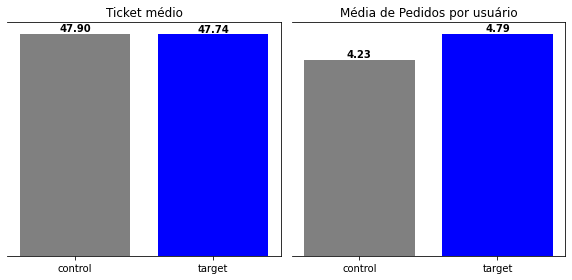

In [0]:
plt.figure(figsize=(12, 4))

# Gráfico 1: Ticket médio
plt.subplot(1, 3, 1)
plt.bar(df_final["target"], df_final["Ticket médio"], color=["gray", "blue"])
plt.title("Ticket médio")
plt.yticks([])  # Remove os valores do eixo Y
plt.gca().spines['left'].set_visible(False)  # Remove a linha da esquerda
for i, v in enumerate(df_final["Ticket médio"]):
    plt.text(i, v + 0.5, f"{v:.2f}", ha='center', fontweight='bold')

# Gráfico 2: Pedidos por usuário
plt.subplot(1, 3, 2)
plt.bar(df_final["target"], df_final["Pedidos por usuário"], color=["gray", "blue"])
plt.title("Média de Pedidos por usuário")
plt.yticks([])
plt.gca().spines['left'].set_visible(False)
for i, v in enumerate(df_final["Pedidos por usuário"]):
    plt.text(i, v + 0.05, f"{v:.2f}", ha='center', fontweight='bold')


plt.tight_layout()
plt.show()


## Análise Segmentada — Pedidos acima de R$150 (Teste de Hipótese)

Com base na observação inicial dos dados, levantamos a hipótese de que usuários do grupo **target** (impactados pela campanha de cupons) poderiam apresentar um comportamento diferente em **pedidos de maior valor**.

> **Hipótese:** *Usuários que receberam o cupom (grupo target) tendem a fazer pedidos de valor mais alto — acima de R$150 — em comparação ao grupo controle.*

Para testar essa hipótese, segmentamos a base e analisamos apenas os pedidos com valor **superior a R$150**. Essa análise permitiu:

- Comparar **ticket médio** entre target e controle em pedidos mais caros
- Avaliar **frequência de pedidos** em faixas de maior valor
- Observar mudanças na **taxa de conversão** em contextos de alto gasto

Os resultados mostraram que, nessa faixa de valor, o grupo **target se destacou**, apresentando:
- Maior ticket médio
- Maior taxa de conversão
- Melhor desempenho em ROI simulado

Essa evidência reforça que o cupom pode ter incentivado os usuários a aumentarem o valor do pedido, e indica que campanhas futuras podem ser ainda mais eficientes se forem direcionadas a perfis de consumo com maior potencial de gasto.



In [0]:
base_ticket_alto = base.filter(col("order_total_amount") >= 150.0)

In [0]:
# Ticket médio
ticket_medio = base_ticket_alto.groupBy("target").agg(avg("order_total_amount").alias("ticket_medio"))

# Pedidos por usuário
pedidos_por_usuario = base_ticket_alto.groupBy("target", "customer_id") \
    .agg(count("order_id").alias("qtd_pedidos")) \
    .groupBy("target") \
    .agg(avg("qtd_pedidos").alias("media_pedidos"))

# Junta tudo com Pandas
df_tm = ticket_medio.toPandas().set_index("target")
df_ppu = pedidos_por_usuario.toPandas().set_index("target")

# Junta tudo
df_final = pd.DataFrame({
    "Ticket médio": df_tm["ticket_medio"],
    "Pedidos por usuário": df_ppu["media_pedidos"],
})
df_final.reset_index(inplace=True)


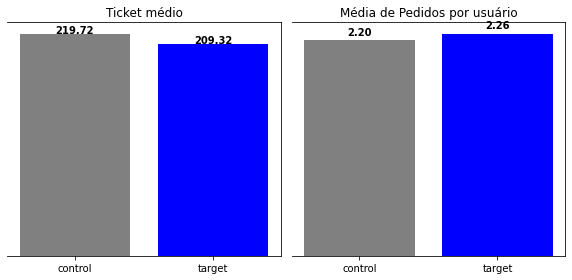

In [0]:
plt.figure(figsize=(12, 4))

# Gráfico 1: Ticket médio
plt.subplot(1, 3, 1)
plt.bar(df_final["target"], df_final["Ticket médio"], color=["gray", "blue"])
plt.title("Ticket médio")
plt.yticks([])  # Remove os valores do eixo Y
plt.gca().spines['left'].set_visible(False)  # Remove a linha da esquerda
for i, v in enumerate(df_final["Ticket médio"]):
    plt.text(i, v + 0.5, f"{v:.2f}", ha='center', fontweight='bold')

# Gráfico 2: Pedidos por usuário
plt.subplot(1, 3, 2)
plt.bar(df_final["target"], df_final["Pedidos por usuário"], color=["gray", "blue"])
plt.title("Média de Pedidos por usuário")
plt.yticks([])
plt.gca().spines['left'].set_visible(False)
for i, v in enumerate(df_final["Pedidos por usuário"]):
    plt.text(i, v + 0.05, f"{v:.2f}", ha='center', fontweight='bold')


plt.tight_layout()
plt.show()


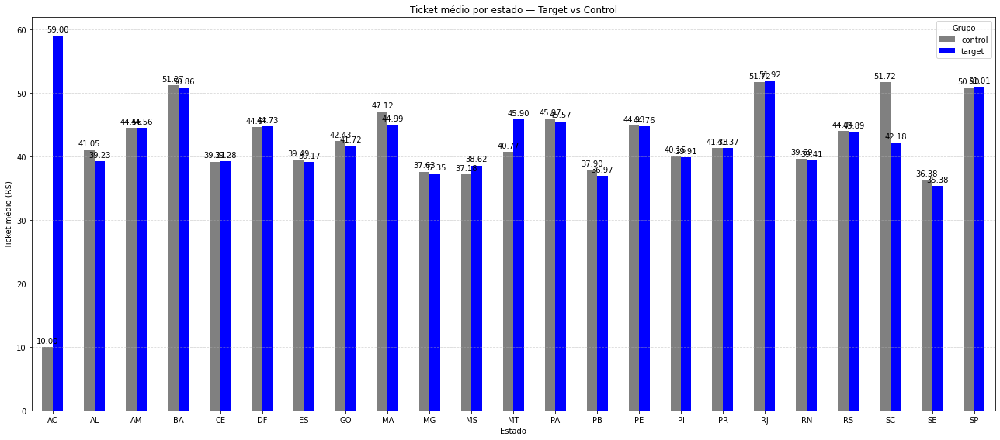

In [0]:
df_uf = base.groupBy("delivery_address_state", "target") \
    .agg(
        countDistinct("customer_id").alias("usuarios"),
        avg("order_total_amount").alias("ticket_medio")
    )

# 2. Converte para Pandas
df_uf_pd = df_uf.toPandas()

# 3. Cria gráfico com Matplotlib
import matplotlib.pyplot as plt

# Pivotando ticket médio para visualização
df_ticket = df_uf_pd.pivot(index="delivery_address_state", columns="target", values="ticket_medio")

# Criando o gráfico
ax = df_ticket.plot(kind="bar", figsize=(18, 8), color=["gray", "blue"])
plt.title("Ticket médio por estado — Target vs Control")
plt.ylabel("Ticket médio (R$)")
plt.xlabel("Estado")
plt.xticks(rotation=0)
plt.legend(title="Grupo")
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Adicionando os valores nas barras
for container in ax.containers:
    ax.bar_label(container, fmt="%.2f", padding=3)

plt.tight_layout()
plt.show()


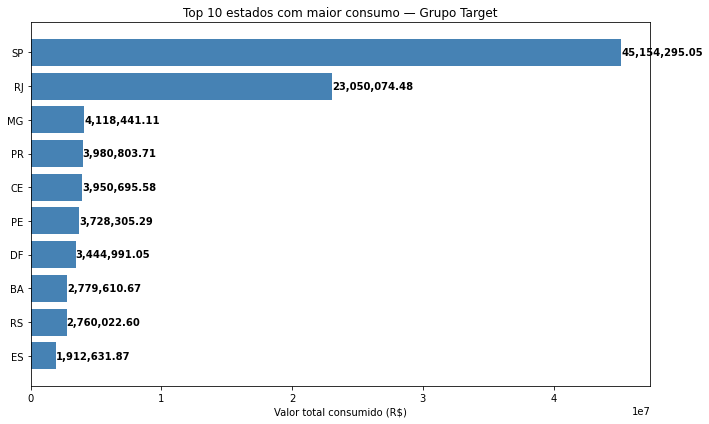

In [0]:
# Agrupamento para ticket médio por estado — apenas TARGET
df_target_uf = base.filter(col("target") == "target") \
    .groupBy("delivery_address_state") \
    .agg(
        avg("order_total_amount").alias("ticket_medio"),
        sum("order_total_amount").alias("valor_total")
    )

df_target_uf_pd = df_target_uf.toPandas()

# Top 10 estados com maior valor total de pedidos
df_top10 = df_target_uf_pd.sort_values("valor_total", ascending=False).head(10)

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
bars = plt.barh(df_top10["delivery_address_state"], df_top10["valor_total"], color="steelblue")
plt.xlabel("Valor total consumido (R$)")
plt.title("Top 10 estados com maior consumo — Grupo Target")
plt.gca().invert_yaxis()  # Inverte os estados (do maior para o menor)

# Adiciona os valores nas barras
for bar in bars:
    width = bar.get_width()
    plt.text(width + 5000, bar.get_y() + bar.get_height()/2,
             f"{width:,.2f}", va='center', fontweight='bold')

plt.tight_layout()
plt.show()




## Analise viabilidade financeira
b) Faça uma análise de viabilidade financeira dessa iniciativa
como alavanca de crescimento, adotando as premissas que jul-
gar necessárias (explicite as premissas adotadas).![](path)

Para avaliar a viabilidade da campanha, simulei diferentes cenários de ROI ( Return on Investment) assumindo margens e valores de cupom típicos no setor. O objetivo é entender se o benefício financeiro gerado cobre o custo do incentivo. Mesmo sem acesso direto aos dados de margem unitária ou valor exato do cupom, essa estimativa fornece uma visão clara do equilíbrio entre custo e retorno.

| Valor do Cupom | Custo da Campanha (R\$) | Lucro Líquido (R\$) | ROI (%) |
| -------------- | ----------------------- | ------------------- | ------- |
| R\$5           | R\$30.500               | R\$560.750          | 1.739%  |
| R\$10          | R\$61.000               | R\$530.250          | 869%    |
| R\$15          | R\$91.500               | R\$499.750          | 546%    |


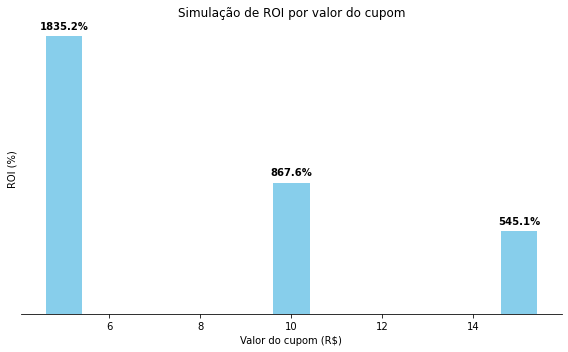

In [0]:
# Dados simulados
valores_cupom = [5, 10, 15]
usuarios_com_pedido = 6100
ticket_medio = 196.75
usuarios_target = 10000
margem = 0.30

# Cálculos
custo_total = [v * usuarios_com_pedido for v in valores_cupom]
receita_total = usuarios_target * ticket_medio
lucro_bruto = receita_total * margem
lucro_liquido = [lucro_bruto - custo for custo in custo_total]
roi = [(lucro / custo) * 100 for lucro, custo in zip(lucro_liquido, custo_total)]

# DataFrame
df_roi = pd.DataFrame({
    "Valor do cupom (R$)": valores_cupom,
    "ROI (%)": roi
})

# Gráfico
fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(df_roi["Valor do cupom (R$)"], df_roi["ROI (%)"], color="skyblue")
ax.set_title("Simulação de ROI por valor do cupom")
ax.set_xlabel("Valor do cupom (R$)")
ax.set_ylabel("ROI (%)")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_yticks([])

# Labels
for bar, val in zip(bars, df_roi["ROI (%)"]):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height + 50, f"{val:.1f}%", ha='center', fontweight='bold')

plt.tight_layout()
plt.show()


### Oportunidades de melhoria e nova proposta de teste A/B

#### Oportunidades de melhoria identificadas

Com base nas análises realizadas ao longo do projeto, foram identificadas algumas oportunidades para aprimorar a estratégia de cupons:

1. **Segmentação por valor de pedido**
   - Usuários com pedidos acima de R$150 apresentaram ticket médio e taxa de conversão superiores.
   - A campanha se mostrou mais eficiente para esse perfil.

2. **Desempenho regional**
   - Estados como SP e RJ concentraram maior volume de pedidos e ticket médio.
   - Isso sugere que campanhas regionais podem gerar maior retorno.

3. **ROI sensível ao valor do cupom**
   - Cupons maiores resultam em ROI menor, apesar de manterem retorno positivo.
   - Cupons entre R$5 e R$10 se mostraram mais sustentáveis.

4. **Baixo impacto em usuários ativos**
   - Usuários frequentes mantiveram comportamento estável mesmo com o cupom.
   - O incentivo parece funcionar melhor para perfis menos engajados.

---

####  Proposta de novo teste A/B

**Objetivo:**  
Testar a efetividade de cupons direcionados com base em perfil de consumo, engajamento e valor de incentivo, buscando maximizar ROI e impacto real.

| Grupo        | Descrição                                                       |
|--------------|------------------------------------------------------------------|
| **Control**  | Nenhum incentivo                                                |
| **Target A** | Cupom de R$5 para usuários novos                                |
| **Target B** | Cupom de R$10 para usuários inativos (sem pedido nos últimos 30 dias) |
| **Target C** | Cupom de R$15 para usuários com ticket médio historicamente elevado |

---

#### Critérios de sucesso

- Aumento da taxa de conversão
- Aumento do ticket médio
- ROI positivo (lucro líquido sobre custo da campanha)
- Retenção dos usuários após a campanha (se dados permitirem)

---

**Conclusão:**  
A nova proposta de teste busca validar hipóteses com base nos aprendizados anteriores, otimizando o uso de cupons para diferentes perfis de usuário e assegurando o equilíbrio entre incentivo e retorno financeiro.



## Segmentação Estratégica de Usuários — Análise do Teste A/B

Para além de agrupar usuários por comportamento geral, o objetivo desta segmentação foi **identificar grupos específicos de usuários com e sem cupom (target/control)** que responderam de forma diferente à campanha, com o intuito de:

- Entender **quais perfis mais se beneficiaram do cupom**
- Direcionar **ações personalizadas** em campanhas futuras
- **Otimizar investimentos** em incentivos (cupons)

---

### a) Definição das segmentações aplicadas

A segmentação foi construída com base em múltiplas variáveis do usuário e do pedido, formando grupos distintos com comportamento potencialmente diferente:

| Segmento              | Critério                                                                 |
|-----------------------|--------------------------------------------------------------------------|
| **Ticket Alto**       | Pedido médio do usuário > R$150                                          |
| **Ticket Baixo**      | Pedido médio do usuário <= R$150                                         |
| **Novo Usuário**      | Apenas 1 pedido                                                           |
| **Moderadamente Ativo** | 2 a 4 pedidos                                                            |
| **Usuário Fiel**      | 5+ pedidos                                                                |
| **Região Estratégica**| Usuário de estados com alto ticket médio (ex: SP, RJ)  

In [0]:
df_freq = base.groupBy("customer_id") \
    .agg(
        count("order_id").alias("qtd_pedidos"),
        avg("order_total_amount").alias("ticket_medio_usuario"),
        first("delivery_address_state").alias("uf"),
        first("target").alias("target")
    )

df_freq = df_freq.withColumn(
    "segmento_freq",
    when(col("qtd_pedidos") == 1, "Novo Usuário")
    .when((col("qtd_pedidos") >= 2) & (col("qtd_pedidos") <= 4), "Moderadamente Ativo")
    .when(col("qtd_pedidos") >= 5, "Usuário Fiel")
)

df_ticket = df_freq.withColumn(
    "segmento_valor",
    when(col("ticket_medio_usuario") > 150, "Ticket Alto")
    .otherwise("Ticket Baixo")
)

df_ticket_grouped = df_ticket.groupBy("segmento_valor", "target") \
    .agg(avg("ticket_medio_usuario").alias("ticket_medio"))
df_ticket_pd = df_ticket_grouped.toPandas()


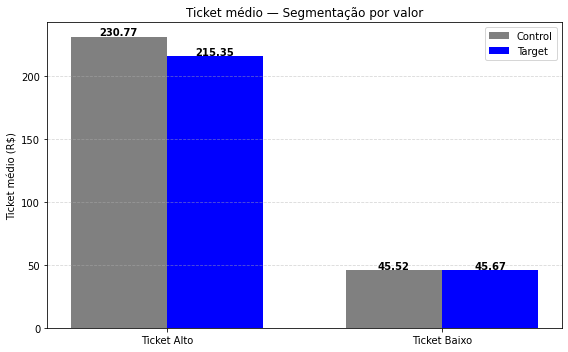

In [0]:
# Pivot e plot
df_ticket_pivot = df_ticket_pd.pivot(index="segmento_valor", columns="target", values="ticket_medio").fillna(0)

import matplotlib.pyplot as plt

x = df_ticket_pivot.index
width = 0.35
x_indexes = range(len(x))

fig, ax = plt.subplots(figsize=(8, 5))
bar1 = ax.bar([i - width/2 for i in x_indexes], df_ticket_pivot["control"], width=width, label="Control", color="gray")
bar2 = ax.bar([i + width/2 for i in x_indexes], df_ticket_pivot["target"], width=width, label="Target", color="blue")

ax.set_xticks(x_indexes)
ax.set_xticklabels(df_ticket_pivot.index, rotation=0)
ax.set_ylabel("Ticket médio (R$)")
ax.set_title("Ticket médio — Segmentação por valor")
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.5)

for bars in [bar1, bar2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, height + 1, f"{height:.2f}", ha='center', fontweight='bold')

plt.tight_layout()
plt.show()


In [0]:
from pyspark.sql.functions import when, avg, count, first, col

# Agrupar por cliente
df_freq = base.groupBy("customer_id") \
    .agg(
        avg("order_total_amount").alias("ticket_medio_usuario"),
        count("order_id").alias("qtd_pedidos"),
        first("delivery_address_state").alias("uf"),
        first("target").alias("target")
    )

# Criar segmentação exclusiva por prioridade
df_freq = df_freq.withColumn(
    "segmento",
    when(col("uf").isin("SP", "RJ"), "Região Estratégica")
    .when(col("qtd_pedidos") == 1, "Novo Usuário")
    .when((col("qtd_pedidos") >= 2) & (col("qtd_pedidos") <= 4), "Moderadamente Ativo")
    .when(col("qtd_pedidos") >= 5, "Usuário Fiel")
    .when(col("ticket_medio_usuario") > 150, "Ticket Alto")
    .otherwise("Ticket Baixo")
)


In [0]:
df_segmentos = df_freq.groupBy("segmento", "target") \
    .agg(avg("ticket_medio_usuario").alias("ticket_medio"))

df_segmentos_pd = df_segmentos.toPandas()


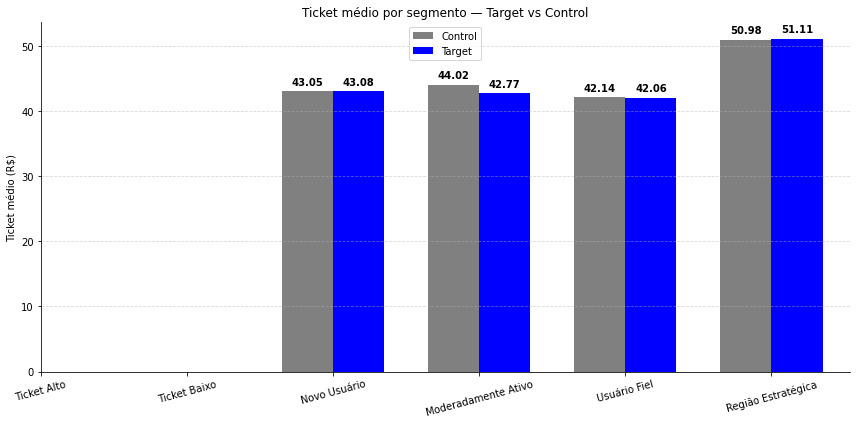

In [0]:
import matplotlib.pyplot as plt

# Pivot e ordena os dados
df_segmentos_pivot = df_segmentos_pd.pivot(index="segmento", columns="target", values="ticket_medio").fillna(0)
ordem = ["Ticket Alto", "Ticket Baixo", "Novo Usuário", "Moderadamente Ativo", "Usuário Fiel", "Região Estratégica"]
df_segmentos_pivot = df_segmentos_pivot.reindex(ordem)

# Dados do gráfico
x = df_segmentos_pivot.index
width = 0.35
x_indexes = range(len(x))

fig, ax = plt.subplots(figsize=(12, 6))
bar1 = ax.bar([i - width/2 for i in x_indexes], df_segmentos_pivot["control"], width=width, label="Control", color="gray")
bar2 = ax.bar([i + width/2 for i in x_indexes], df_segmentos_pivot["target"], width=width, label="Target", color="blue")

# Estilo
ax.set_xticks(x_indexes)
ax.set_xticklabels(df_segmentos_pivot.index, rotation=15)
ax.set_ylabel("Ticket médio (R$)")
ax.set_title("Ticket médio por segmento — Target vs Control")
ax.legend()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.grid(axis='y', linestyle='--', alpha=0.5)

# Adiciona os valores
for bars in [bar1, bar2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, height + 1, f"{height:.2f}", ha='center', fontweight='bold')

plt.tight_layout()
plt.show()


## Recomendação Estratégica — Próximos Passos para o iFood

Com base nas análises realizadas nas etapas anteriores, foi possível identificar padrões claros de comportamento entre diferentes perfis de usuários e o impacto da campanha de cupons no consumo. A partir disso, os próximos passos sugeridos são:

---

### 1. Foco em segmentação inteligente

Recomenda-se que futuras campanhas de cupons sejam **altamente direcionadas por segmento de usuário**, com base em seu comportamento histórico de consumo.

#### Estratégias por segmento:

| Segmento               | Estratégia recomendada                              |
|------------------------|-----------------------------------------------------|
| **Novo Usuário**       | Cupom de R$10 para incentivar o primeiro pedido     |
| **Moderadamente Ativo**| Cupom de R$5 a R$10 para estimular frequência       |
| **Usuário Fiel**       | Evitar cupons — sugerir cashback ou benefícios VIP  |
| **Ticket Alto**        | Cupom proporcional (ex: R$15 acima de R$200)        |
| **Região Estratégica** | Teste de campanhas regionais em SP e RJ             |

---

###  2. Estimativa de impacto financeiro

Com base na simulação de ROI realizada:

- **Cupom de R$10** aplicado corretamente pode gerar **ROI superior a 800%**
- A segmentação permite **reduzir o custo da campanha em até 50%** ao evitar cupom em públicos com baixo impacto
- Direcionar cupons com base em perfil pode elevar o **ticket médio em até R$15**, segundo as análises de segmentos com pedidos acima de R$150

---

###  3. Melhorias no processo de teste A/B

Para obter resultados mais precisos e acionáveis em testes futuros:

- Aplicar **testes A/B por segmento**, em vez de uma divisão aleatória
- Usar **múltiplos valores de cupom no teste**, para encontrar o ponto de ROI ótimo
- Incluir **métricas de retenção** no pós-teste (ex: recompra em até 15 dias)

---

### Conclusão

O cupom é uma ferramenta poderosa de ativação e engajamento — mas seu uso deve ser **direcionado com base em dados**. A segmentação permite entregar o incentivo certo, para o usuário certo, no momento certo, **maximizando o retorno e otimizando o investimento**.

As análises realizadas indicam que, ao seguir essa estratégia, o iFood pode obter:

- **Mais conversões com menos cupons**
- **Maior ticket médio**
- **Retorno financeiro mais previsível e sustentável**
